In [830]:
# description       : Predict Airline customr satisfaction using naive bayes classificator
# author            : raulsainz
# email             : 
# date              : 20210326
# version           : 0.1
#==============================================================================

In [831]:
#Import necesary libraries
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import learning_curve
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.naive_bayes import GaussianNB

In [832]:
#Setup pandas display parameters
pd.options.display.max_columns = 50
pd.options.display.max_rows = 200
pd.options.display.max_colwidth= 50
pd.options.display.precision = 3

In [833]:
#Define initial model parameters
cv_n_split = 3
random_state = 42
test_train_split = 0.25

# Dataset
## Data Set Information:
This dataset contains an airline passenger satisfaction survey. What factors are highly correlated to a satisfied (or dissatisfied) passenger? Can you predict passenger satisfaction?

<br>
Source: https://www.kaggle.com/teejmahal20/airline-passenger-satisfaction

## Attribute Information:

1.	Gender: Gender of the passengers (Female, Male)
2.	Customer Type: The customer type (Loyal customer, disloyal customer)
3.	Age: The actual age of the passengers
4.	Type of Travel: Purpose of the flight of the passengers (Personal Travel, Business Travel)
5.	Class: Travel class in the plane of the passengers (Business, Eco, Eco Plus)
6.	Flight distance: The flight distance of this journey
7.	Inflight wifi service: Satisfaction level of the inflight wifi service (0:Not Applicable;1-5)
8.	Departure/Arrival time convenient: Satisfaction level of Departure/Arrival time convenient
9.	Ease of Online booking: Satisfaction level of online booking
10.	Gate location: Satisfaction level of Gate location
11.	Food and drink: Satisfaction level of Food and drink
12.	Online boarding: Satisfaction level of online boarding
13.	Seat comfort: Satisfaction level of Seat comfort
14.	Inflight entertainment: Satisfaction level of inflight entertainment
15.	On-board service: Satisfaction level of On-board service
16.	Leg room service: Satisfaction level of Leg room service
17.	Baggage handling: Satisfaction level of baggage handling
18.	Check-in service: Satisfaction level of Check-in service
19.	Inflight service: Satisfaction level of inflight service
20.	Cleanliness: Satisfaction level of Cleanliness
21.	Departure Delay in Minutes: Minutes delayed when departure
22.	Arrival Delay in Minutes: Minutes delayed when Arrival
23.	**Satisfaction: Airline satisfaction level(Satisfaction, neutral or dissatisfaction)** ===Target Variable===

In [834]:
df = pd.read_csv('datasets/survey-train.csv')
df_test = pd.read_csv('datasets/survey-test.csv')


In [835]:
#Review number or rows and columns
df_test.shape

(25976, 25)

In [836]:
#review column data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 25 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Unnamed: 0                         103904 non-null  int64  
 1   id                                 103904 non-null  int64  
 2   Gender                             103904 non-null  object 
 3   Customer Type                      103904 non-null  object 
 4   Age                                103904 non-null  int64  
 5   Type of Travel                     103904 non-null  object 
 6   Class                              103904 non-null  object 
 7   Flight Distance                    103904 non-null  int64  
 8   Inflight wifi service              103904 non-null  int64  
 9   Departure/Arrival time convenient  103904 non-null  int64  
 10  Ease of Online booking             103904 non-null  int64  
 11  Gate location                      1039

In [837]:
df.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied


In [838]:
pd.DataFrame({
                'unicos':df.nunique(),
                'missing total': df.isna().sum(),
              'missing %': df.isna().sum()/df.count(),
              'tipo':df.dtypes})

,unicos,missing total,missing %,tipo
Unnamed: 0,103904,0,0.000,int64
id,103904,0,0.000,int64
Gender,2,0,0.000,object
Customer Type,2,0,0.000,object
Age,75,0,0.000,int64
Type of Travel,2,0,0.000,object
Class,3,0,0.000,object
Flight Distance,3802,0,0.000,int64
Inflight wifi service,6,0,0.000,int64
Departure/Arrival time convenient,6,0,0.000,int64


There are 310 missing values in column "Arrival Delay" probably only delayed flights have this data.
 

In [839]:
#Drop non usefull columns Unamed (old index) and survey id
df.drop(['id','Unnamed: 0'],axis='columns', inplace=True)
df_test.drop(['id','Unnamed: 0'],axis='columns', inplace=True)

In [840]:
#df = pd.get_dummies(df,columns=['Gender','Customer Type','Type of Travel','satisfaction','Class'])
df.dtypes

Gender                                object
Customer Type                         object
Age                                    int64
Type of Travel                        object
Class                                 object
Flight Distance                        int64
Inflight wifi service                  int64
Departure/Arrival time convenient      int64
Ease of Online booking                 int64
Gate location                          int64
Food and drink                         int64
Online boarding                        int64
Seat comfort                           int64
Inflight entertainment                 int64
On-board service                       int64
Leg room service                       int64
Baggage handling                       int64
Checkin service                        int64
Inflight service                       int64
Cleanliness                            int64
Departure Delay in Minutes             int64
Arrival Delay in Minutes             float64
satisfacti

In [841]:
df["Male"] = np.where(df["Gender"] == 'Male' , 1, 0)
df["LoyalCustomer"] = np.where(df["Customer Type"] == 'Loyal Customer' , 1, 0)
df["BussinesTravel"] = np.where(df["Type of Travel"] == 'Business travel' , 1, 0)
df["satisfied"] = np.where(df["satisfaction"] == 'satisfied' , 1, 0)
df["BussinessClass"] = np.where(df["Class"] == 'Business' , 1, 0)




In [842]:
df_test["Male"] = np.where(df_test["Gender"] == 'Male' , 1, 0)
df_test["LoyalCustomer"] = np.where(df_test["Customer Type"] == 'Loyal Customer' , 1, 0)
df_test["BussinesTravel"] = np.where(df_test["Type of Travel"] == 'Business travel' , 1, 0)
df_test["satisfied"] = np.where(df_test["satisfaction"] == 'satisfied' , 1, 0)
df_test["BussinessClass"] = np.where(df_test["Class"] == 'Business' , 1, 0)

In [843]:
df_test.shape

(25976, 28)

In [844]:
df.columns[23:28]

Index(['Male', 'LoyalCustomer', 'BussinesTravel', 'satisfied',
       'BussinessClass'],
      dtype='object')

In [845]:
#Crate a list witl all the categorical variables
categorical_columns = list(df.columns[6:20])
categorical_columns.extend(list(df.columns[23:28]))
categorical_columns.extend(['Gender','Class','Customer Type','Type of Travel','satisfaction'])
categorical_columns

['Inflight wifi service',
 'Departure/Arrival time convenient',
 'Ease of Online booking',
 'Gate location',
 'Food and drink',
 'Online boarding',
 'Seat comfort',
 'Inflight entertainment',
 'On-board service',
 'Leg room service',
 'Baggage handling',
 'Checkin service',
 'Inflight service',
 'Cleanliness',
 'Male',
 'LoyalCustomer',
 'BussinesTravel',
 'satisfied',
 'BussinessClass',
 'Gender',
 'Class',
 'Customer Type',
 'Type of Travel',
 'satisfaction']

In [846]:
for col in categorical_columns:
    print('============================================')
    print(df[col].value_counts())

3    25868
2    25830
4    19794
1    17840
5    11469
0     3103
Name: Inflight wifi service, dtype: int64
4    25546
5    22403
3    17966
2    17191
1    15498
0     5300
Name: Departure/Arrival time convenient, dtype: int64
3    24449
2    24021
4    19571
1    17525
5    13851
0     4487
Name: Ease of Online booking, dtype: int64
3    28577
4    24426
2    19459
1    17562
5    13879
0        1
Name: Gate location, dtype: int64
4    24359
5    22313
3    22300
2    21988
1    12837
0      107
Name: Food and drink, dtype: int64
4    30762
3    21804
5    20713
2    17505
1    10692
0     2428
Name: Online boarding, dtype: int64
4    31765
5    26470
3    18696
2    14897
1    12075
0        1
Name: Seat comfort, dtype: int64
4    29423
5    25213
3    19139
2    17637
1    12478
0       14
Name: Inflight entertainment, dtype: int64
4    30867
5    23648
3    22833
2    14681
1    11872
0        3
Name: On-board service, dtype: int64
4    28789
5    24667
3    20098
2    19525
1    

In [847]:
#Fix data types for categorical columns
for col in categorical_columns:
    df[col] = df[col].astype('category')
    df_test[col] = df_test[col].astype('category')
df.dtypes

Gender                               category
Customer Type                        category
Age                                     int64
Type of Travel                       category
Class                                category
Flight Distance                         int64
Inflight wifi service                category
Departure/Arrival time convenient    category
Ease of Online booking               category
Gate location                        category
Food and drink                       category
Online boarding                      category
Seat comfort                         category
Inflight entertainment               category
On-board service                     category
Leg room service                     category
Baggage handling                     category
Checkin service                      category
Inflight service                     category
Cleanliness                          category
Departure Delay in Minutes              int64
Arrival Delay in Minutes          

In [848]:
df.describe()

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes
count,103904.000,103904.000,103904.000,103594.000
mean,39.380,1189.448,14.816,15.179
std,15.115,997.147,38.231,38.699
min,7.000,31.000,0.000,0.000
25%,27.000,414.000,0.000,0.000
50%,40.000,843.000,0.000,0.000
75%,51.000,1743.000,12.000,13.000
max,85.000,4983.000,1592.000,1584.000


/Users/raulsainz/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


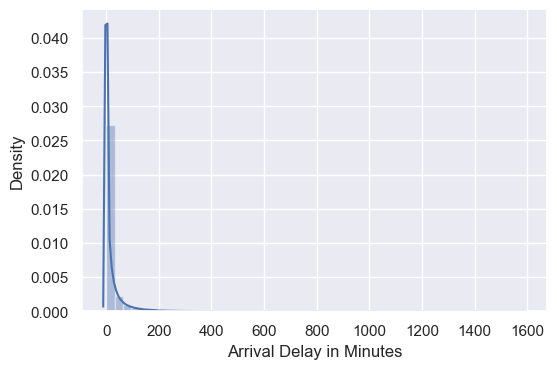

In [849]:
sns.set_theme()
ax = sns.distplot(df['Arrival Delay in Minutes'])

(0.0, 20.0)

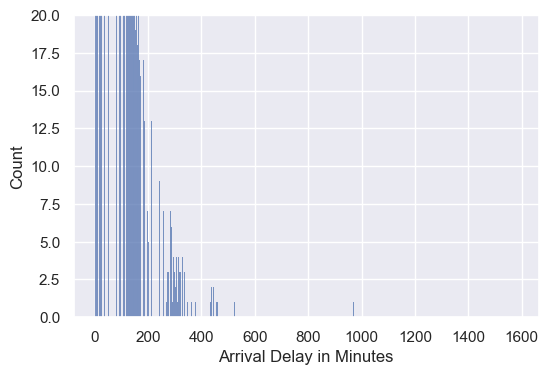

In [850]:
sns.histplot(data = df,x = 'Arrival Delay in Minutes')
plt.ylim(0, 20)

<AxesSubplot:xlabel='Arrival Delay in Minutes', ylabel='Count'>

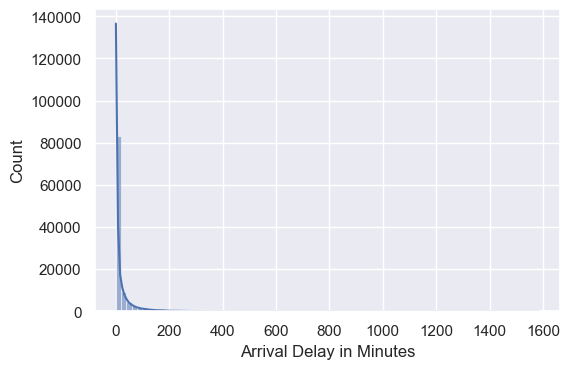

In [851]:
sns.histplot(data = df['Arrival Delay in Minutes'], bins=80, kde=True)

<AxesSubplot:xlabel='Arrival Delay in Minutes'>

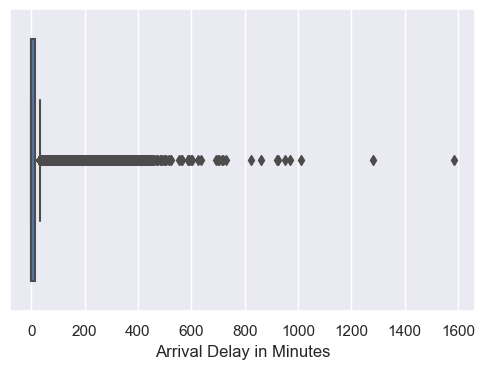

In [852]:
sns.boxplot(x=df["Arrival Delay in Minutes"])

/Users/raulsainz/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/raulsainz/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/raulsainz/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with

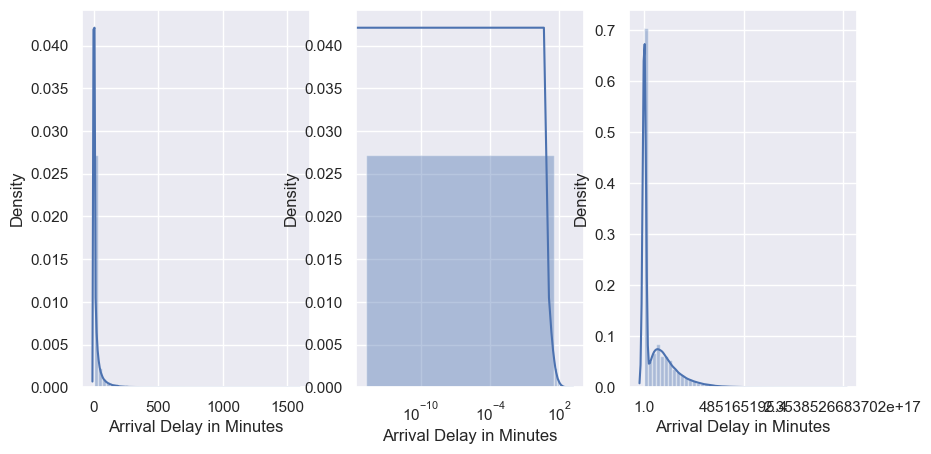

In [853]:
fig, ax = plt.subplots(1, 3, figsize=(10, 5))
data = df['Arrival Delay in Minutes']
sns.distplot(df['Arrival Delay in Minutes'], ax=ax[0])
sns.distplot(df['Arrival Delay in Minutes'], ax=ax[1])
ax[1].set_xscale("log")
sns.distplot(np.sqrt(data), ax=ax[2])
ax[2].set_xticklabels([round(d, 1) for d in np.exp(ax[2].get_xticks())]);

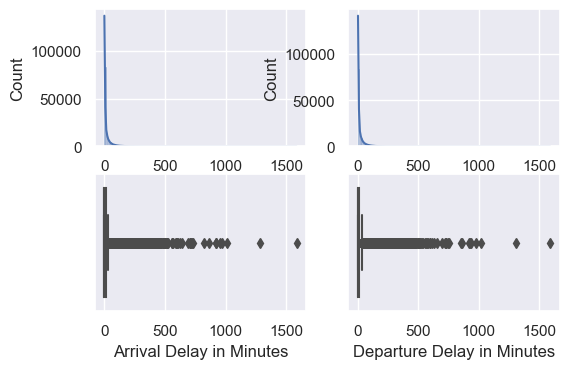

In [854]:

#plt.figure(figsize=(10,10))
sns.set_theme()
fig, axs = plt.subplots(ncols=2,nrows=2)
sns.histplot(x = 'Arrival Delay in Minutes',  data = df, ax = axs[0,0], kde = True , bins = 80)
sns.histplot(x = 'Departure Delay in Minutes', data = df, ax = axs[0,1], kde = True , bins = 80)
sns.boxplot( x = 'Arrival Delay in Minutes', data = df, ax = axs[1,0])
sns.boxplot( x = 'Departure Delay in Minutes', data = df, ax = axs[1,1])
plt.show()

<AxesSubplot:>

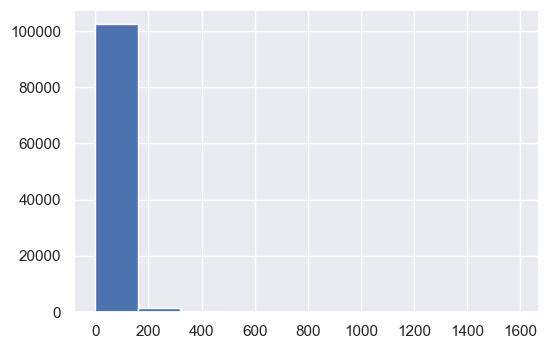

In [855]:
df['Departure Delay in Minutes'].hist()

In [856]:
df.describe()

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes
count,103904.000,103904.000,103904.000,103594.000
mean,39.380,1189.448,14.816,15.179
std,15.115,997.147,38.231,38.699
min,7.000,31.000,0.000,0.000
25%,27.000,414.000,0.000,0.000
50%,40.000,843.000,0.000,0.000
75%,51.000,1743.000,12.000,13.000
max,85.000,4983.000,1592.000,1584.000


In [857]:
df[df["Departure Delay in Minutes"]>query].sort_values(by='Departure Delay in Minutes', ascending=False)

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Male,LoyalCustomer,BussinesTravel,satisfied,BussinessClass
83741,Female,Loyal Customer,47,Personal Travel,Eco,1120,2,2,2,3,2,4,2,2,4,4,4,2,3,2,1592,1584.0,neutral or dissatisfied,0,1,0,0,0
6744,Male,Loyal Customer,32,Business travel,Business,2916,2,2,2,2,5,5,5,3,4,5,4,5,3,5,1305,1280.0,satisfied,1,1,1,1,1
61310,Male,Loyal Customer,49,Business travel,Business,1959,1,1,1,1,4,4,4,4,4,4,5,4,4,4,1017,1011.0,satisfied,1,1,1,1,1
72206,Male,Loyal Customer,30,Personal Travel,Eco,1598,1,4,1,2,1,1,1,5,3,4,4,1,4,1,978,970.0,neutral or dissatisfied,1,1,0,0,0
80182,Male,Loyal Customer,47,Business travel,Business,2187,4,5,4,4,4,4,4,5,4,5,5,4,4,4,933,920.0,satisfied,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48500,Male,Loyal Customer,35,Business travel,Business,2978,4,4,4,4,4,3,4,4,4,4,4,4,4,4,13,12.0,neutral or dissatisfied,1,1,1,0,1
48567,Male,disloyal Customer,21,Business travel,Eco,268,2,2,2,4,5,2,5,5,2,3,3,4,4,5,13,13.0,neutral or dissatisfied,1,0,1,0,0
27505,Male,Loyal Customer,67,Personal Travel,Eco,255,2,5,0,1,4,0,4,4,2,5,2,1,1,4,13,11.0,neutral or dissatisfied,1,1,0,0,0
60747,Male,Loyal Customer,25,Personal Travel,Eco,399,3,3,3,3,1,3,1,1,1,3,3,1,3,1,13,13.0,neutral or dissatisfied,1,1,0,0,0


In [858]:
query = df["Departure Delay in Minutes"].quantile(0.75)

df[df["Departure Delay in Minutes"]>query].shape

(25776, 28)

In [859]:
df["Departure Delay in Minutes"].quantile(0.99)

181.97000000000116

In [860]:
df[df["Departure Delay in Minutes"]>240].shape

(478, 28)

In [868]:
maxValue = 60
#Replace extremely high values on columns by a maximum value
df['DelayDeptTime']= np.where((df["Departure Delay in Minutes"] >maxValue),maxValue,df["Departure Delay in Minutes"])
df['DelayArrTime']= np.where((df["Arrival Delay in Minutes"] >maxValue),maxValue,df["Arrival Delay in Minutes"])
df_test['DelayDeptTime']= np.where((df_test["Departure Delay in Minutes"] >maxValue),maxValue,df_test["Departure Delay in Minutes"])
df_test['DelayArrTime']= np.where((df_test["Arrival Delay in Minutes"] >maxValue),maxValue,df_test["Arrival Delay in Minutes"])
#Drop the old columns
#df.drop(['Departure Delay in Minutes','Arrival Delay in Minutes'],axis='columns', inplace=True)
df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Male,LoyalCustomer,BussinesTravel,satisfied,BussinessClass,DelayDeptTime,DelayArrTime,DelayArrBool,DelayDeptBool
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied,1,1,0,0,0,25,18.0,1,1
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied,1,0,1,0,1,1,6.0,0,0
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied,0,1,1,1,1,0,0.0,0,0
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied,0,1,1,0,1,11,9.0,0,0
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied,1,1,1,1,1,0,0.0,0,0


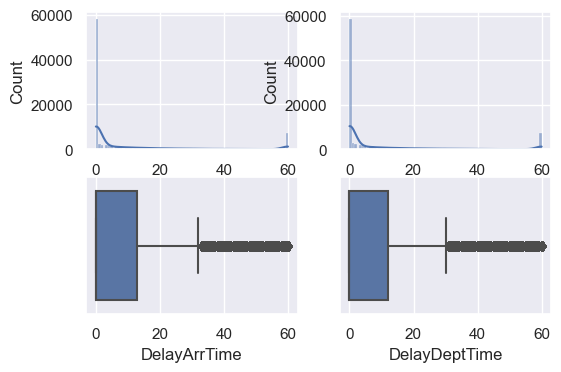

In [869]:
#plt.figure(figsize=(10,10))
sns.set_theme()
fig, axs = plt.subplots(ncols=2,nrows=2)
sns.histplot(x = 'DelayArrTime',  data = df, ax = axs[0,0], kde = True , bins = 80)
sns.histplot(x = 'DelayDeptTime', data = df, ax = axs[0,1], kde = True , bins = 80)
sns.boxplot( x = 'DelayArrTime', data = df, ax = axs[1,0])
sns.boxplot( x = 'DelayDeptTime', data = df, ax = axs[1,1])
plt.show()

In [870]:
df.describe()

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,DelayDeptTime,DelayArrTime,DelayArrBool,DelayDeptBool
count,103904.000,103904.000,103904.000,103594.000,103904.000,103594.000,103904.000,103904.000
mean,39.380,1189.448,14.816,15.179,10.398,10.632,0.227,0.222
std,15.115,997.147,38.231,38.699,18.229,18.307,0.419,0.415
min,7.000,31.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,27.000,414.000,0.000,0.000,0.000,0.000,0.000,0.000
50%,40.000,843.000,0.000,0.000,0.000,0.000,0.000,0.000
75%,51.000,1743.000,12.000,13.000,12.000,13.000,0.000,0.000
max,85.000,4983.000,1592.000,1584.000,60.000,60.000,1.000,1.000


In [864]:
df[df['DelayArrTime'].isna()]

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Male,LoyalCustomer,BussinesTravel,satisfied,BussinessClass,DelayDeptTime,DelayArrTime
213,Female,Loyal Customer,38,Business travel,Eco,109,5,3,3,3,5,5,5,5,5,2,4,1,1,5,31,NaN,satisfied,0,1,1,1,0,31,NaN
1124,Male,Loyal Customer,53,Personal Travel,Eco,1012,3,2,3,4,4,3,4,4,4,4,4,3,3,4,38,NaN,neutral or dissatisfied,1,1,0,0,0,38,NaN
1529,Male,Loyal Customer,39,Business travel,Business,733,2,5,5,5,2,4,3,2,2,2,2,2,2,3,11,NaN,neutral or dissatisfied,1,1,1,0,1,11,NaN
2004,Female,disloyal Customer,26,Business travel,Business,1035,3,3,3,1,2,3,2,2,3,3,4,5,5,2,41,NaN,neutral or dissatisfied,0,0,1,0,1,41,NaN
2108,Female,Loyal Customer,24,Personal Travel,Eco,417,2,1,2,2,5,2,5,5,1,4,2,1,2,5,1,NaN,neutral or dissatisfied,0,1,0,0,0,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102067,Male,Loyal Customer,49,Personal Travel,Eco Plus,1249,2,5,2,3,2,3,3,3,4,5,4,3,4,3,230,NaN,neutral or dissatisfied,1,1,0,0,0,60,NaN
102384,Male,Loyal Customer,58,Business travel,Eco,733,3,3,3,3,3,3,3,3,3,1,2,4,2,3,55,NaN,neutral or dissatisfied,1,1,1,0,0,55,NaN
102552,Female,disloyal Customer,29,Business travel,Eco,1107,2,1,1,1,5,1,3,5,4,1,5,5,3,5,0,NaN,neutral or dissatisfied,0,0,1,0,0,0,NaN
102960,Male,Loyal Customer,58,Business travel,Eco,1088,4,4,1,1,5,4,5,5,1,5,5,5,3,5,0,NaN,satisfied,1,1,1,1,0,0,NaN


In [865]:
df['DelayArrTime'].isna().sum()

310

In [871]:
# NA Values on column: 
print('NA values before: ' + str(df['DelayArrTime'].isna().sum()))
#Replace NA values with 0, meaning no delay upon arrival
df['DelayArrTime'] = df['DelayArrTime'].fillna(0)
df['DelayArrBool'] = np.where(df["DelayArrTime"] > 15 , 1, 0)
df['DelayDeptBool'] = np.where(df["DelayDeptTime"] > 15 , 1, 0)
#NA Values after fill with 0
print('NA values after: ' + str(df['DelayArrTime'].isna().sum()))

NA values before: 310
NA values after: 0


In [872]:
# NA Values on column: 
print('NA values before: ' + str(df_test['DelayArrTime'].isna().sum()))
#Replace NA values with 0, meaning no delay upon arrival
df_test['DelayArrTime'] = df_test['DelayArrTime'].fillna(0)
df_test['DelayArrBool'] = np.where(df_test["DelayArrTime"] > 15 , 1, 0)
df_test['DelayDeptBool'] = np.where(df_test["DelayDeptTime"] > 15 , 1, 0)
#NA Values after fill with 0
print('NA values after: ' + str(df_test['DelayArrTime'].isna().sum()))

NA values before: 83
NA values after: 0


<AxesSubplot:xlabel='DelayArrBool', ylabel='count'>

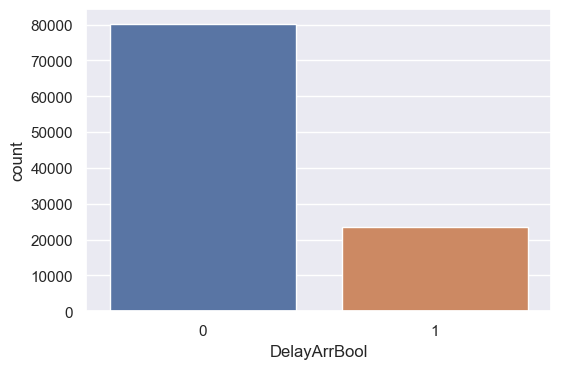

In [756]:
df['DelayDeptBool'].value_counts()
sns.countplot(x = 'DelayArrBool',  data = df )

<Figure size 1000x1000 with 0 Axes>

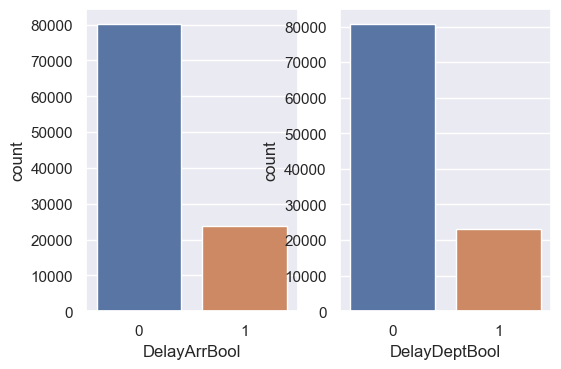

In [757]:
plt.figure(figsize=(10,10))
sns.set_theme()
fig, axs = plt.subplots(ncols=2)
sns.countplot(x = 'DelayArrBool',  data = df, ax = axs[0] )
sns.countplot(x = 'DelayDeptBool', data = df, ax = axs[1] )
plt.show()

<AxesSubplot:>

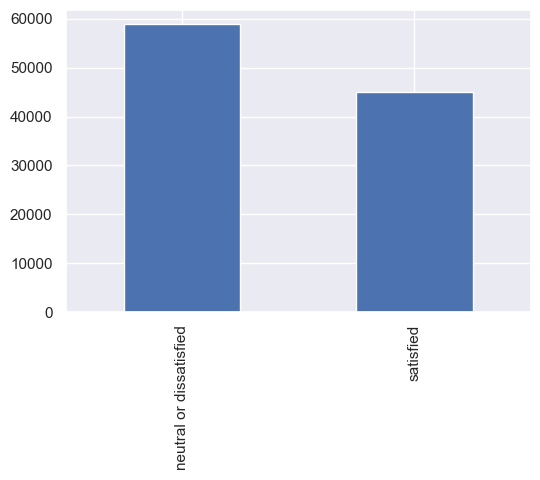

In [758]:
df['satisfaction'].value_counts().plot(kind='bar')

In [759]:
pd.crosstab(df['satisfied'], df['Customer Type'],margins=True)

Customer Type,Loyal Customer,disloyal Customer,All
satisfied,,,
0,44390,14489,58879
1,40533,4492,45025
All,84923,18981,103904


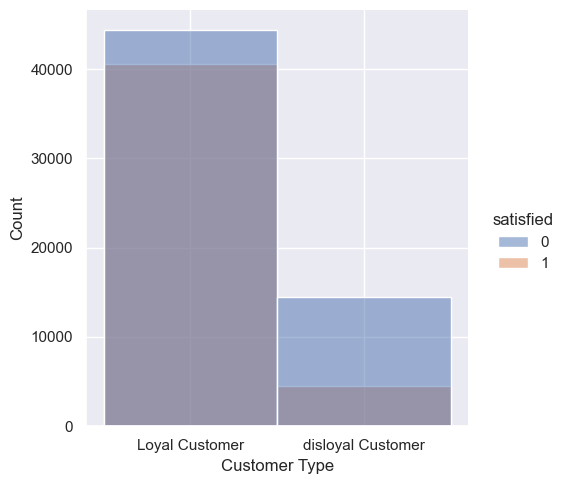

In [760]:
sns.displot(df, x="Customer Type", hue="satisfied")


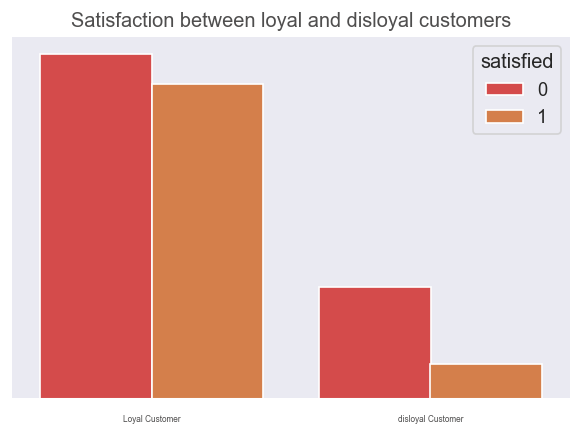

In [761]:
# Remove y axis tick labels and y axis label
plt.rcParams['figure.dpi'] = 120
#sns.set(style="whitegrid")fig, ax = plt.subplots(figsize=(12,4))
sns.countplot(data=df, x="Customer Type", hue="satisfied", palette=['#eb3434', '#eb7a34', '#ebae34'])
plt.xlabel('')
plt.ylabel('')
plt.title('Satisfaction between loyal and disloyal customers', size=12, color='#4f4e4e')
plt.xticks(size=5, color='#4f4e4e')
plt.yticks([], [])
sns.despine(left=True);

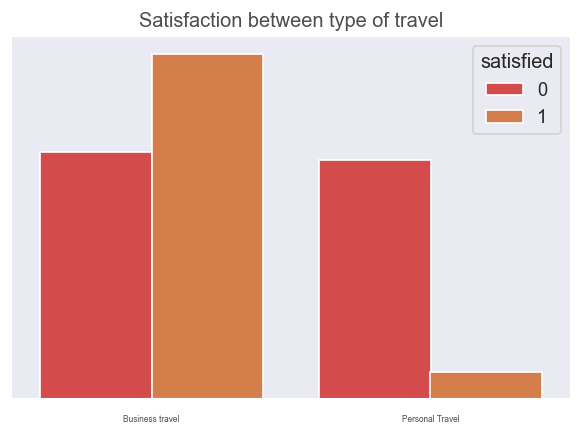

In [762]:
sns.countplot(data=df, x="Type of Travel", hue="satisfied", palette=['#eb3434', '#eb7a34', '#ebae34'])
plt.xlabel('')
plt.ylabel('')
plt.title('Satisfaction between type of travel', size=12, color='#4f4e4e')
plt.xticks(size=5, color='#4f4e4e')
plt.yticks([], [])
sns.despine(left=True);

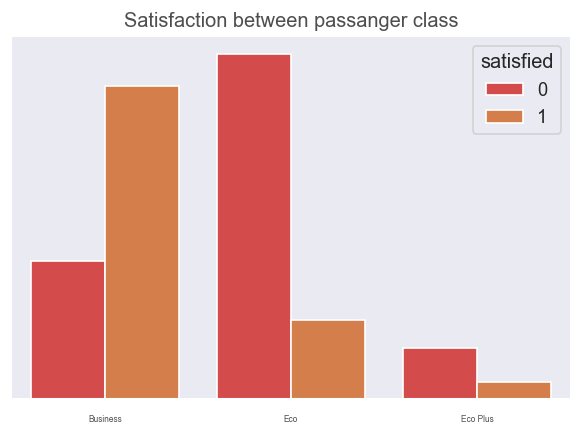

In [763]:
sns.countplot(data=df, x="Class", hue="satisfied", palette=['#eb3434', '#eb7a34', '#ebae34'])
plt.xlabel('')
plt.ylabel('')
plt.title('Satisfaction between passanger class', size=12, color='#4f4e4e')
plt.xticks(size=5, color='#4f4e4e')
plt.yticks([], [])
sns.despine(left=True);

<AxesSubplot:xlabel='Age', ylabel='Count'>

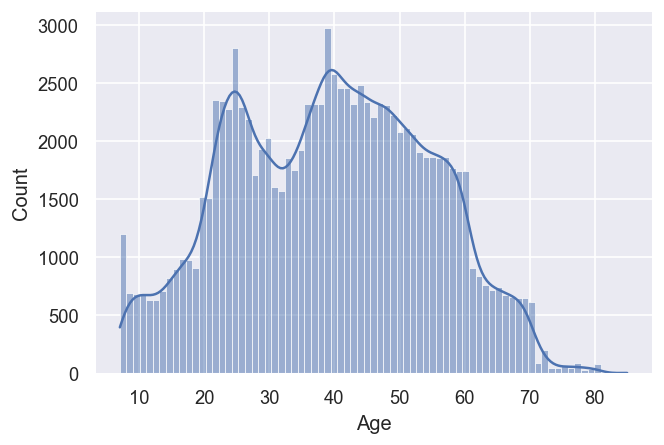

In [764]:
sns.histplot(data = df['Age'], kde=True)

/Users/raulsainz/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/raulsainz/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


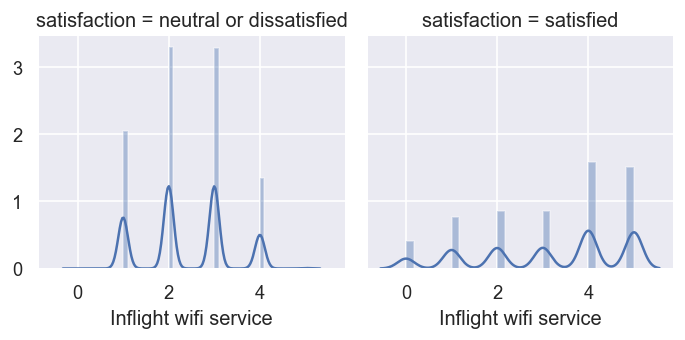

In [765]:
g = sns.FacetGrid(df, col="satisfaction")
g.map(sns.distplot, "Inflight wifi service")

In [766]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 32 columns):
 #   Column                             Non-Null Count   Dtype   
---  ------                             --------------   -----   
 0   Gender                             103904 non-null  category
 1   Customer Type                      103904 non-null  category
 2   Age                                103904 non-null  int64   
 3   Type of Travel                     103904 non-null  category
 4   Class                              103904 non-null  category
 5   Flight Distance                    103904 non-null  int64   
 6   Inflight wifi service              103904 non-null  category
 7   Departure/Arrival time convenient  103904 non-null  category
 8   Ease of Online booking             103904 non-null  category
 9   Gate location                      103904 non-null  category
 10  Food and drink                     103904 non-null  category
 11  Online boarding           

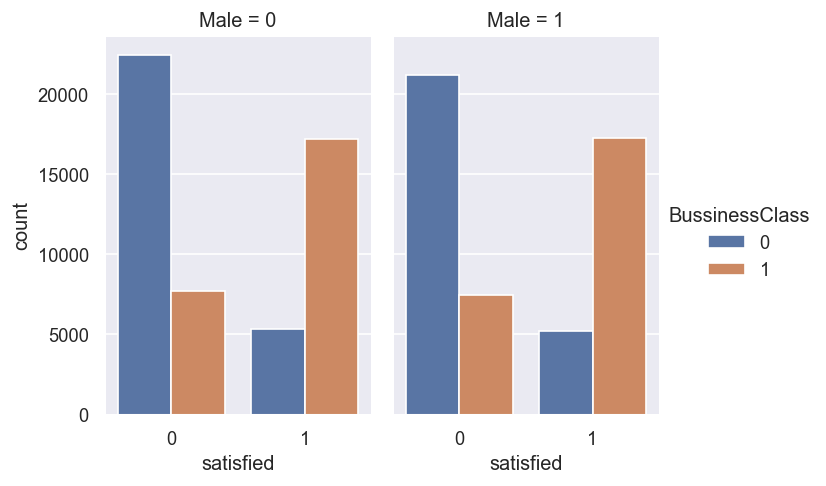

In [767]:
g = sns.catplot(x="satisfied", hue="BussinessClass", col="Male",
                 data=df, kind="count",
                 height=4, aspect=.7);

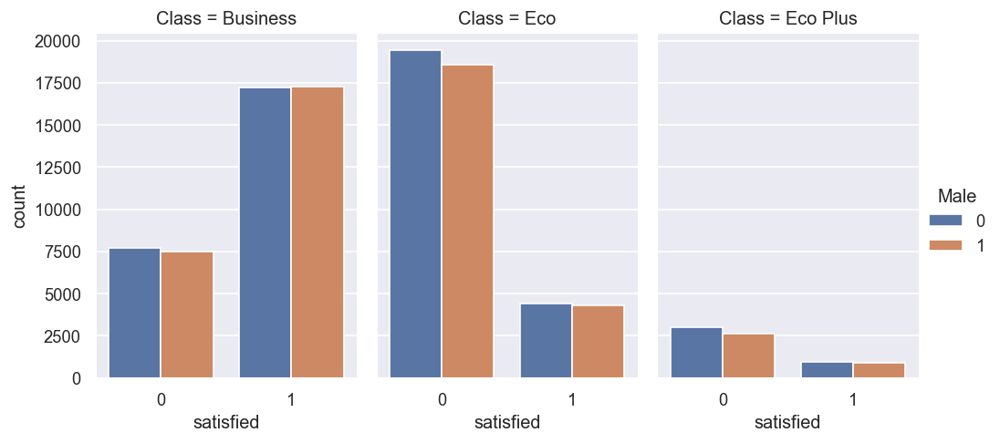

In [768]:
g = sns.catplot(x="satisfied", hue="Male", col="Class",
...                 data=df, kind="count",
...                 height=4, aspect=.7);

/Users/raulsainz/opt/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


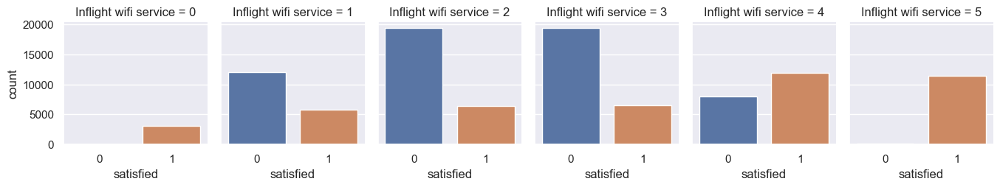

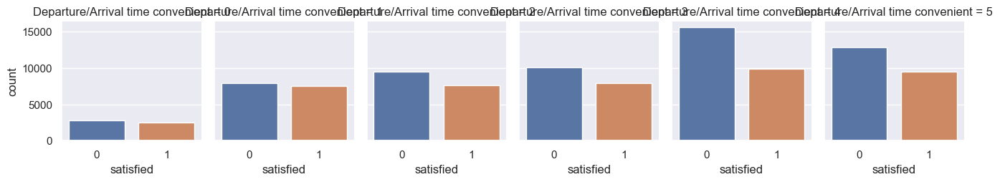

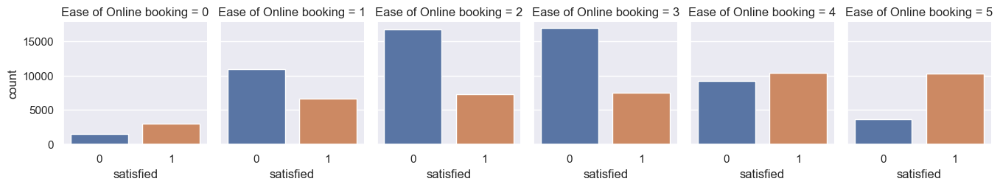

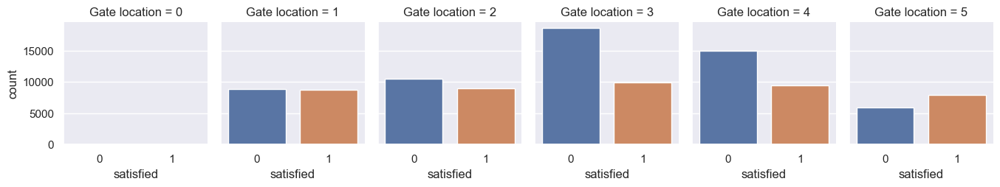

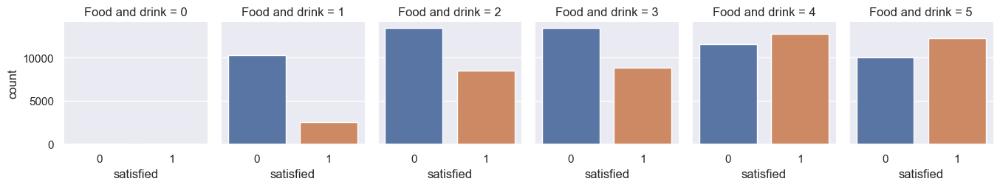

...

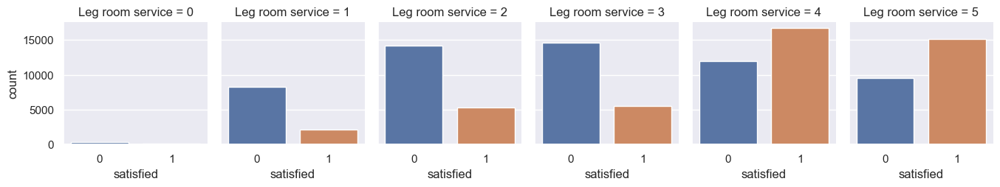

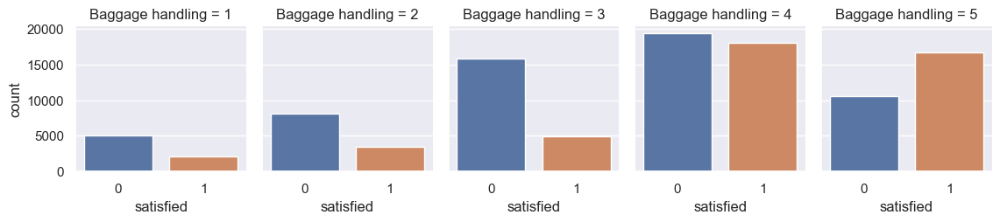

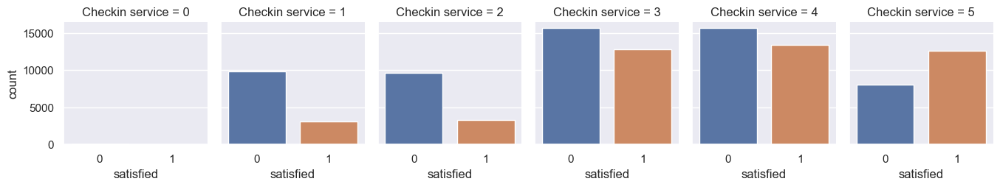

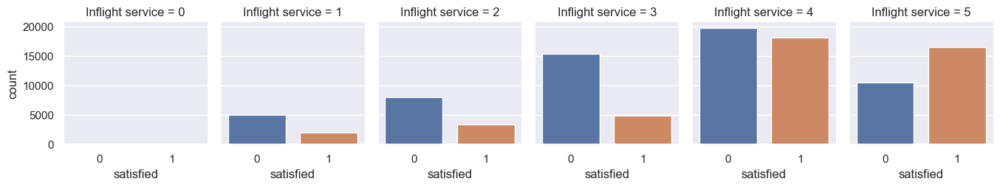

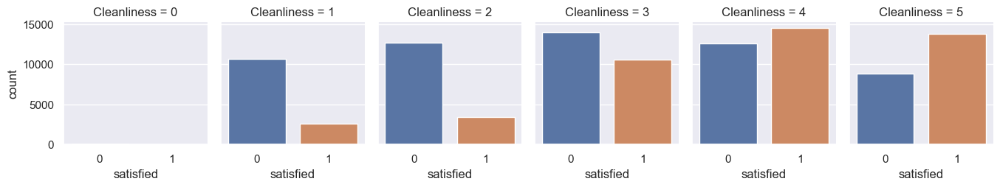

In [769]:
# Remove y axis tick labels and y axis label
plt.rcParams['figure.dpi'] = 100
for  col in survey:
    sns.catplot("satisfied", col=col, col_wrap=6, data=df, kind="count", height=2.5, aspect=.9)

Inflight wifi service
Departure/Arrival time convenient
Ease of Online booking
Gate location
Food and drink
Online boarding
Seat comfort
Inflight entertainment
On-board service
Leg room service
Baggage handling
Checkin service
Inflight service
Cleanliness


In [874]:
survey = df.columns[6:20]
data = df[survey]

In [881]:
df['satisfied']

0         0
1         0
2         1
3         0
4         1
         ..
103899    0
103900    1
103901    0
103902    0
103903    0
Name: satisfied, Length: 103904, dtype: category
Categories (2, int64): [0, 1]

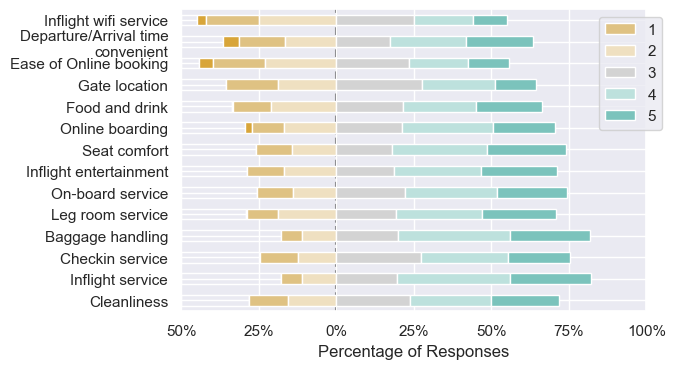

In [882]:

# Now plot it!
import plot_likert

plot_likert.plot_likert(data, scales, plot_percentage=True,colors = plot_likert.colors.likert7);

In [479]:
plot_likert.colors.likert10


['#ffffff00',
 '#d8b365',
 '#dfc283',
 '#e7d1a2',
 '#efe0c1',
 '#f7efe0',
 '#def0ee',
 '#bde1dd',
 '#9cd2cd',
 '#7bc3bc',
 '#5ab4ac']

In [507]:
df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Male,LoyalCustomer,Bussines,satisfied,BussinesTravel,satisfied
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied,True,True,False,False,False,False
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied,True,False,True,False,True,False
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied,False,True,True,True,True,True
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied,False,True,True,False,True,False
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied,True,True,True,True,True,True


In [474]:
print(plot_likert.scales.raw5_0)

<module 'plot_likert.scales' from '/Users/raulsainz/opt/anaconda3/lib/python3.7/site-packages/plot_likert/scales.py'>


<AxesSubplot:>

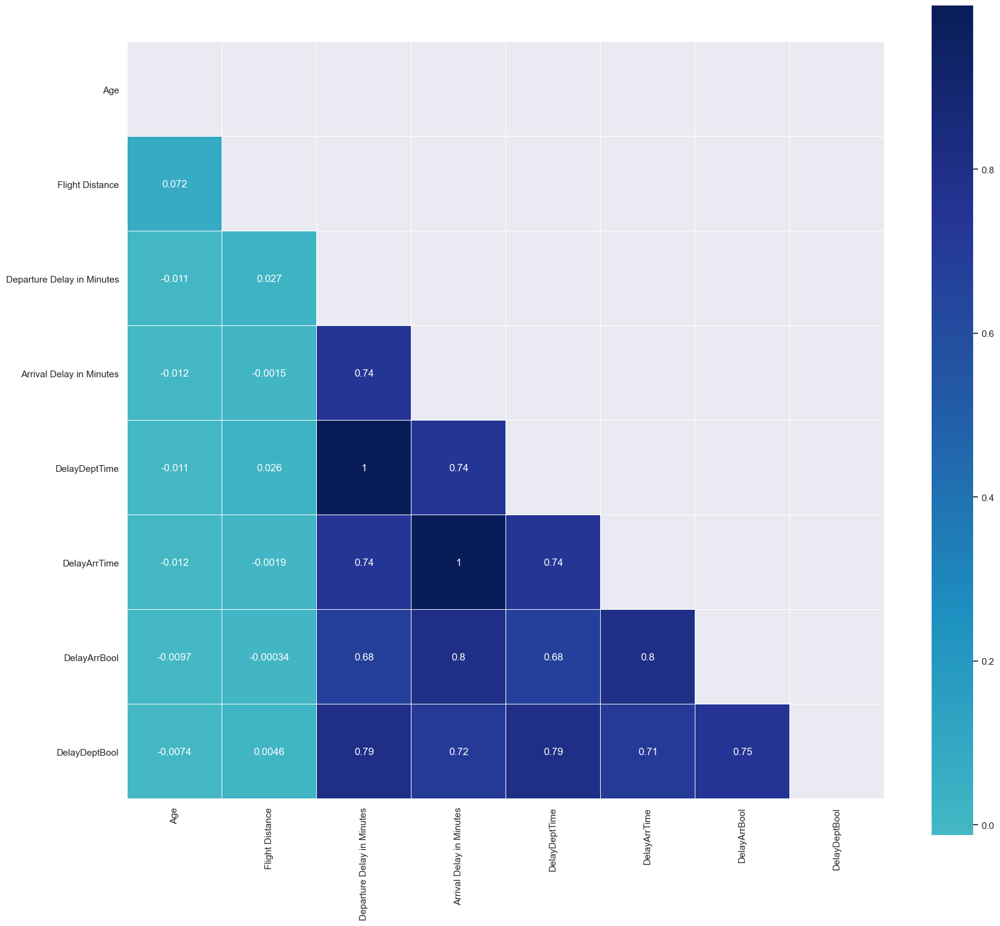

In [624]:
corr = df.corr(method='spearman')
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 18))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, annot = True, mask=mask, cmap="YlGnBu", center=0,
            square=True, linewidths=.5)

In [772]:
df.dtypes

Gender                               category
Customer Type                        category
Age                                     int64
Type of Travel                       category
Class                                category
Flight Distance                         int64
Inflight wifi service                category
Departure/Arrival time convenient    category
Ease of Online booking               category
Gate location                        category
Food and drink                       category
Online boarding                      category
Seat comfort                         category
Inflight entertainment               category
On-board service                     category
Leg room service                     category
Baggage handling                     category
Checkin service                      category
Inflight service                     category
Cleanliness                          category
Departure Delay in Minutes              int64
Arrival Delay in Minutes          

In [773]:
df.drop(['satisfaction','Customer Type','Gender','Type of Travel','Class','DelayDeptTime','DelayArrTime','Arrival Delay in Minutes','Departure Delay in Minutes'], axis='columns', inplace=True)
df.head()

,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Male,LoyalCustomer,BussinesTravel,satisfied,BussinessClass,DelayArrBool,DelayDeptBool
0,13,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,1,1,0,0,0,1,1
1,25,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,0,1,0,1,0,0
2,26,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,1,1,1,1,0,0
3,25,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,0,1,1,0,1,0,0
4,61,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,1,1,1,1,1,0,0


In [ ]:
(df.shape)
rint(df.)

In [632]:
y_train = df.pop('satisfied')
y_test = df_test.pop('satisfied')
X_train = df
X_test = df_test

In [633]:
print(y_train.shape)
print(y_test.shape)
print(X_train.shape)
print(X_test.shape)

(103904,)
(25976,)
(103904, 31)
(25976, 25)


In [774]:
#Split the data into DV and IV's
X = df.drop('satisfied',axis=1)
print(X.shape)
y = df['satisfied']
print(y.shape)

(103904, 22)
(103904,)


In [789]:
X_train.head()

,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Male,LoyalCustomer,BussinesTravel,satisfied,BussinessClass,DelayArrBool,DelayDeptBool
22672,11,602,1,4,1,1,3,1,3,3,3,4,5,4,4,3,1,1,0,0,0,0,0
13770,45,447,4,4,4,4,5,5,4,2,2,2,2,5,2,5,1,1,1,1,1,0,0
47909,42,956,4,1,1,1,5,1,4,3,3,4,3,5,3,2,0,1,1,1,0,0,0
29822,51,163,3,4,3,3,3,3,4,4,4,3,4,2,4,2,0,1,0,0,0,0,0
52456,33,3218,2,5,5,5,2,2,2,2,4,1,3,3,3,2,1,1,1,0,1,1,0


In [775]:
#spliting the dataset
X_train,X_test, y_train,y_test = train_test_split(df,y,random_state=random_state)

In [714]:
#creating labelEncoder
le = preprocessing.LabelEncoder()
# Converting string labels into numbers.
cat_encoder =le.fit_transform(df)
print cat_encoder

SyntaxError: Missing parentheses in call to 'print'. Did you mean print(cat_encoder)? (<ipython-input-714-824b54ebd3f0>, line 5)

In [776]:
#Create a Gaussian Classifier
naiveBayes1 = GaussianNB()
naiveBayes1.fit(X_train,y_train)

GaussianNB()

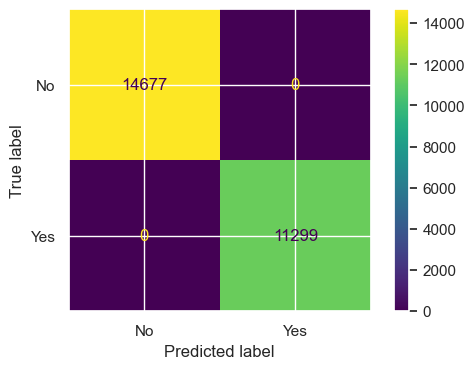

In [778]:
plot_confusion_matrix(naiveBayes1,X_test,y_test, display_labels=['No','Yes'])

In [779]:
 #Predict the response for test dataset
y_pred = naiveBayes1.predict(X_test)
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 1.0


ROC_AUC = 1.0
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     14677
           1    1.00000   1.00000   1.00000     11299

    accuracy                        1.00000     25976
   macro avg    1.00000   1.00000   1.00000     25976
weighted avg    1.00000   1.00000   1.00000     25976



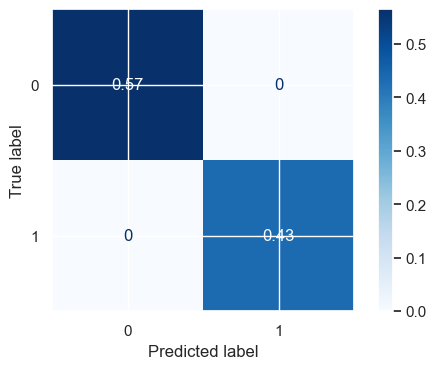

In [784]:
model_rf, roc_auc_rf = run_model(naiveBayes1, X_train, y_train, X_test, y_test)

In [790]:
scores = cross_val_score(naiveBayes1,X_train,y_train,cv=10) #Evaluate a score by cross-validation

In [791]:
print(scores)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [783]:
def run_model(model, X_train, y_train, X_test, y_test, verbose=True):
    if verbose == False:
        model.fit(X_train,y_train, verbose=0)
    else:
        model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    roc_auc = roc_auc_score(y_test, y_pred)
    print("ROC_AUC = {}".format(roc_auc))
    print(classification_report(y_test,y_pred,digits=5))
    plot_confusion_matrix(model, X_test, y_test,cmap=plt.cm.Blues, normalize = 'all')
    
    return model, roc_auc

In [ ]:
# Using cross-validation
decision_tree = DecisionTreeClassifier()
param_grid = {
                'min_samples_leaf': [i for i in range(2,10)],
                'ccp_alpha': cpp_alphas                
                }
decision_tree_CV = GridSearchCV(decision_tree, param_grid=param_grid, cv=cv_train, verbose=False)
decision_tree_CV.fit(X_train, y_train)

print('Best Params :',decision_tree_CV.best_params_)
print('Best score :',decision_tree_CV.best_score_)
y_preds = decision_tree_CV.best_estimator_.predict(X_test)
print('Accuracy :',decision_tree_CV.best_estimator_.score(X_test,y_test))
print('classification report')
print(classification_report(y_test,y_preds))